In [47]:
#how do we import opencv
import cv2
print(cv2.__version__)

4.8.0


In [48]:
#downloading and zipping our imgaes
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2024-06-22 09:33:58--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 3.5.246.2, 52.95.191.42, 3.5.244.164, ...
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|3.5.246.2|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2024-06-22 09:33:59 ERROR 404: Not Found.

unzip:  cannot find or open images.zip, images.zip.zip or images.zip.ZIP.


In [49]:
#we were not able to download the image load the image
image = cv2.imread('/content/sample.jfif')

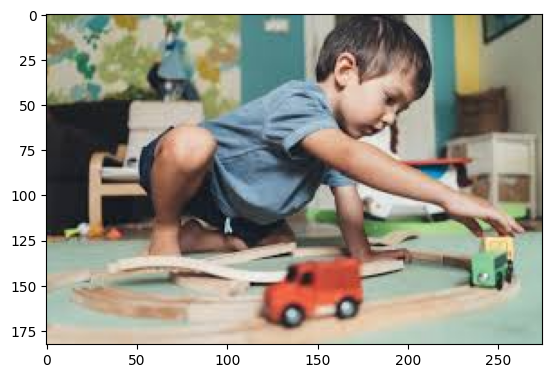

In [50]:
#displaying images
from matplotlib import pyplot as plt
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

In [51]:
def imshow(title, image = None):
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title(title)
  plt.axis('off')
  plt.show

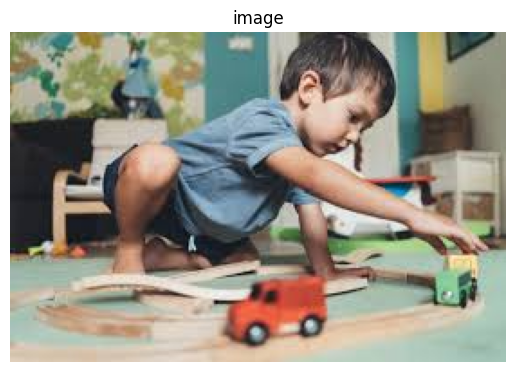

In [52]:
imshow("image", image)

In [53]:
#saving the image
cv2.imwrite('output.png', image)

True

In [54]:
#displaying image dimensions

In [55]:
import numpy as np
print(image.shape)

(183, 275, 3)


In this part we are going to see how to convert RGB colored image into greyscale image.


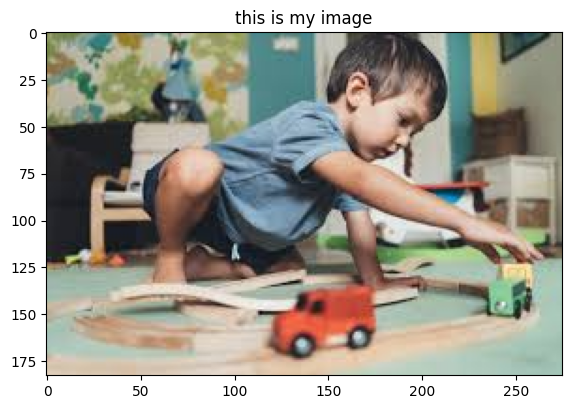

In [56]:
def imshow(title, image = None, size = 10):
  w, h = image.shape[0], image.shape[1]
  aspect_ratio = w/h
  plt.figure(figsize=(size*aspect_ratio, size))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.title(title)
  plt.show

imshow("this is my image", image)

In [57]:
grey_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)#there are more options  like you can converrt it to greyscale or any other type


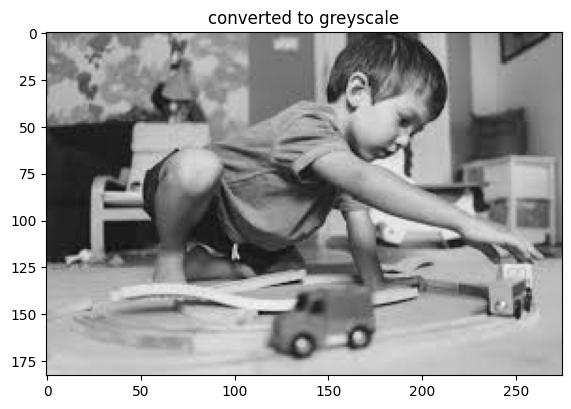

In [58]:
imshow("converted to greyscale", grey_image)

In [59]:
image.shape

(183, 275, 3)

In [60]:
grey_image.shape

(183, 275)

Drawing on images, something that i am not doing.

Next one is color spaces but i think that is not important so i am not doing it


**Transformations: translations and rotations**



*   perform image translations

*   rotations with get rotationsmatrix 2d

*   Rotations with transpose
*   Flipping image







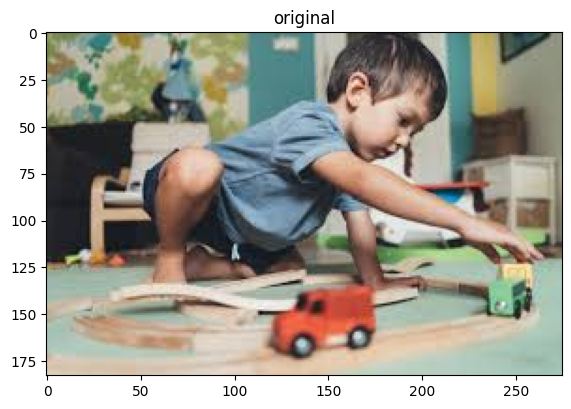

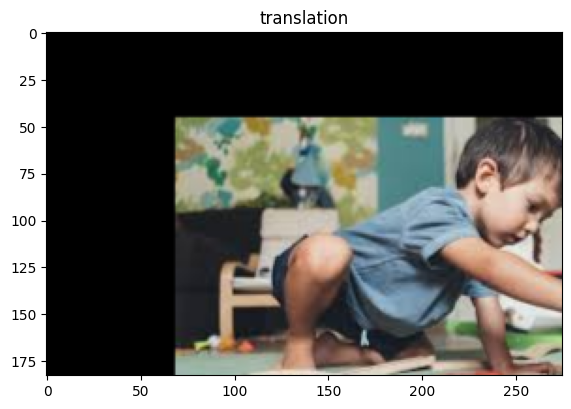

In [61]:
imshow("original",image)

height,  width = image.shape[:2]
quarter_height, quarter_width = height/4, width/4

T = np.float32( [[1, 0, quarter_width], [0, 1, quarter_height]])

#code to transform the image
img_translation = cv2.warpAffine(image, T, (width,height))
imshow("translation", img_translation)

In [62]:
print(T)

[[ 1.    0.   68.75]
 [ 0.    1.   45.75]]


In [63]:
#rotation

#rotation_matrix = cv2.getRotationMatrix2D((rotation_center_x, rotation_center_y), angle_of_rotation, scale)

In [64]:
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 45, 0.5)

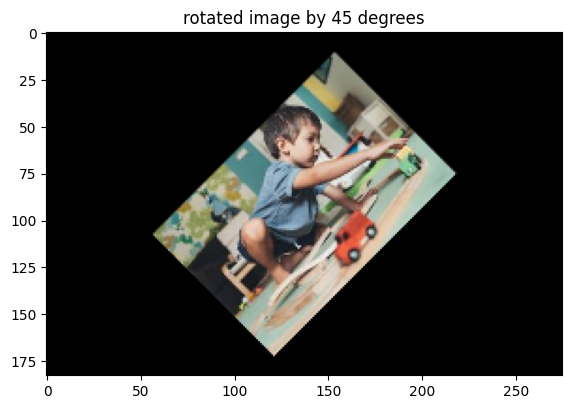

In [65]:
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("rotated image by 45 degrees", rotated_image)

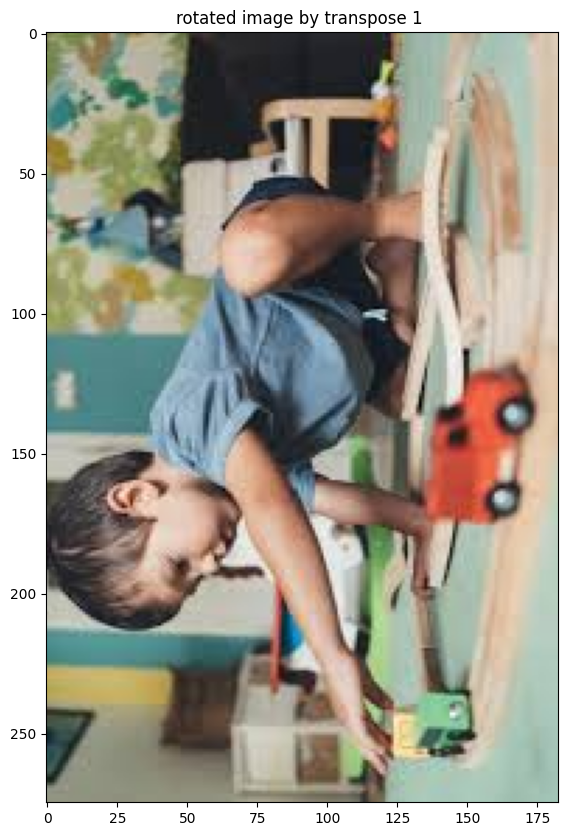

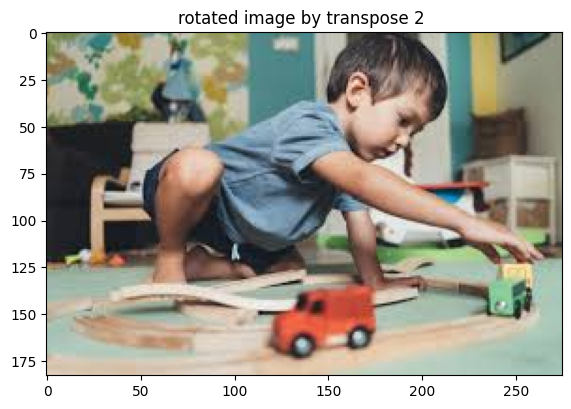

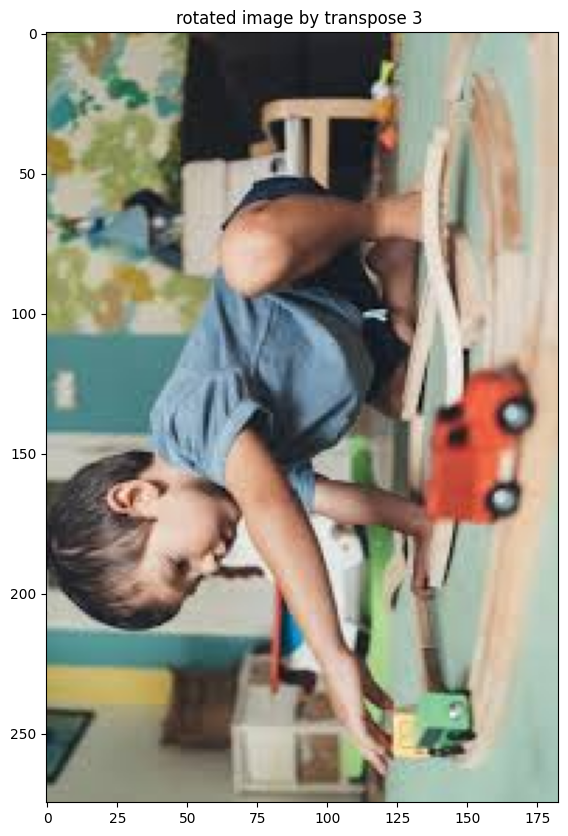

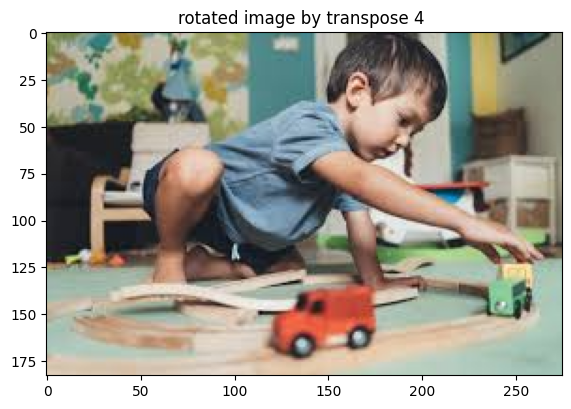

In [66]:
#rotating using transpose
rotated_image_transpose = cv2.transpose(image)
imshow("rotated image by transpose 1 ", rotated_image_transpose)

rotated_image_transpose = cv2.transpose(rotated_image_transpose)
imshow("rotated image by transpose 2 ", rotated_image_transpose)

rotated_image_transpose = cv2.transpose(rotated_image_transpose)
imshow("rotated image by transpose 3 ", rotated_image_transpose)

rotated_image_transpose = cv2.transpose(rotated_image_transpose)
imshow("rotated image by transpose 4 ", rotated_image_transpose)

In [67]:
#the above example rotation is similar to that of transpose matrix

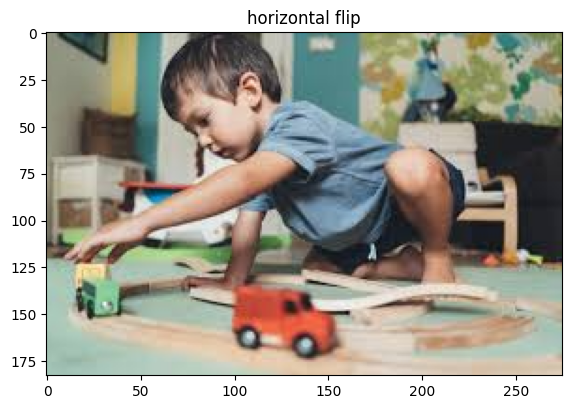

In [68]:
#lets flip it horizontally
flipped = cv2.flip(image, 1)
imshow("horizontal flip", flipped)

**Scaling Re-sizing Interpolation Cropping **


1.   how to resize and scale images
2.   image pyramids
3. cropping









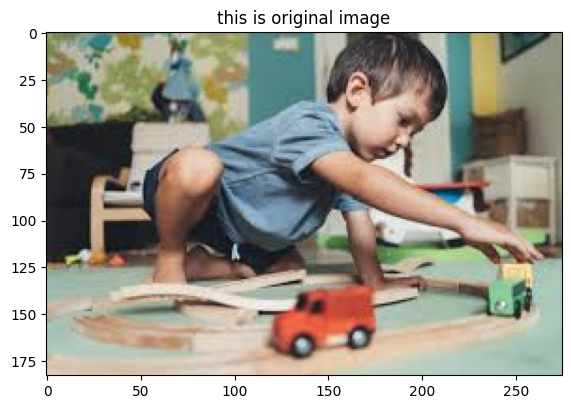

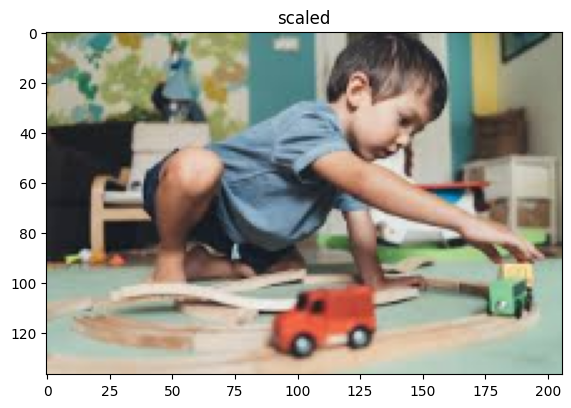

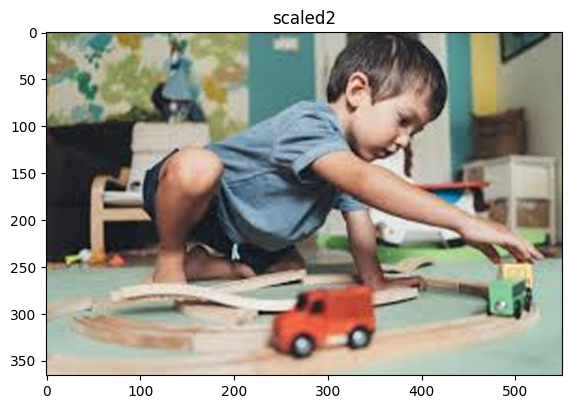

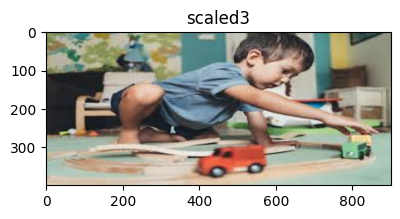

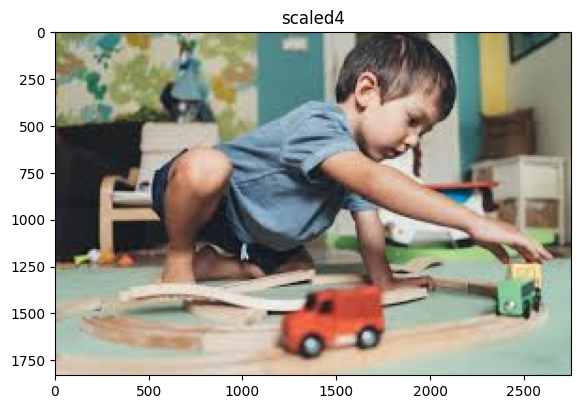

In [69]:
imshow("this is original image", image)
#cv2.resize(image, dsize(output image size), x scale, y scale, interpolation)
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)
imshow("scaled", image_scaled)

image_scaled2 = cv2.resize(image, None, fx=2, fy=2, interpolation = cv2.INTER_CUBIC)
imshow( "scaled2", image_scaled2)

image_scaled3 = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)
imshow("scaled3", image_scaled3)

image_scaled4 = cv2.resize(image, None, fx=10, fy=10, interpolation = cv2.INTER_NEAREST)
imshow( "scaled4", image_scaled4)

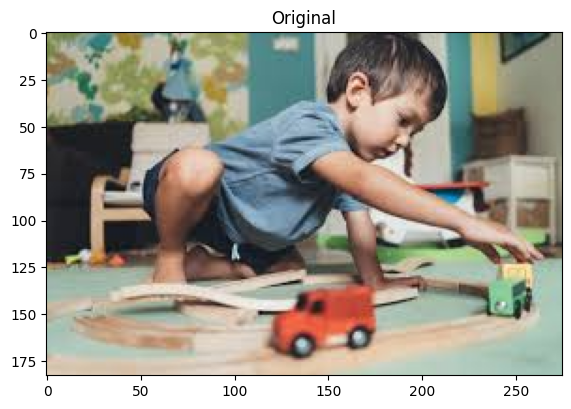

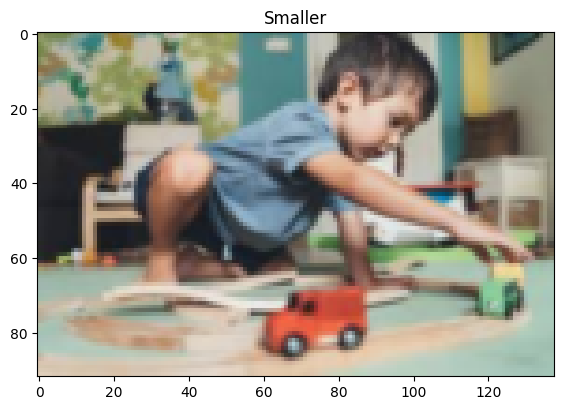

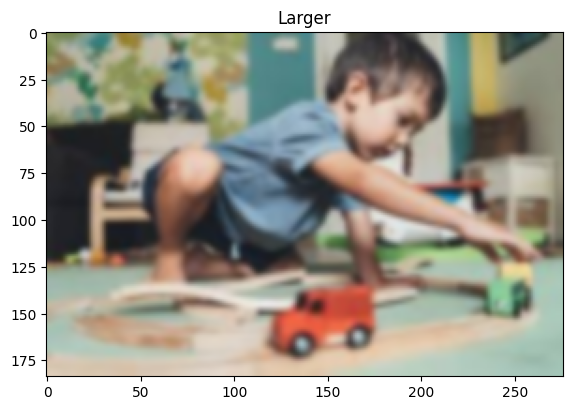

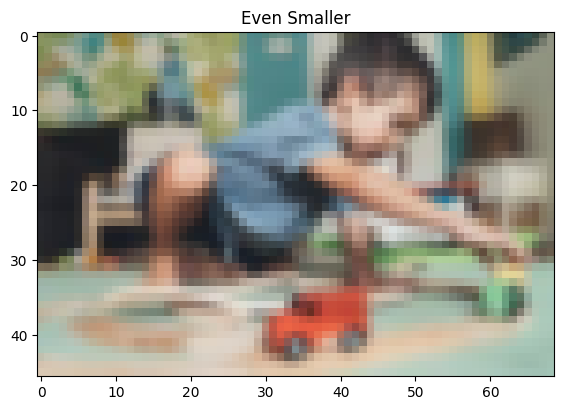

In [70]:


smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)

imshow("Original", image)
imshow('Smaller', smaller)
imshow('Larger', larger)

even_smaller = cv2.pyrDown(smaller)
imshow('Even Smaller', even_smaller)

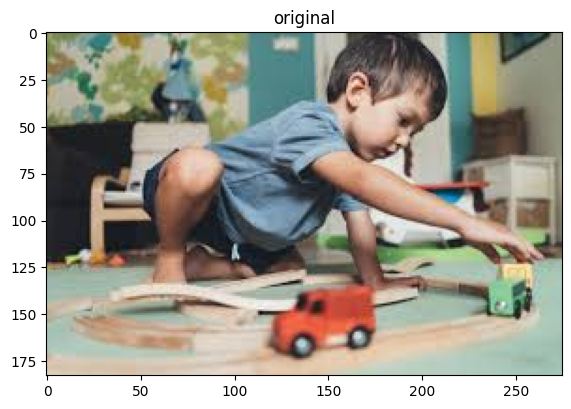

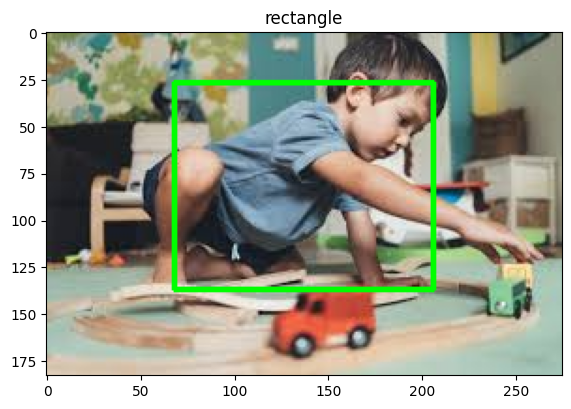

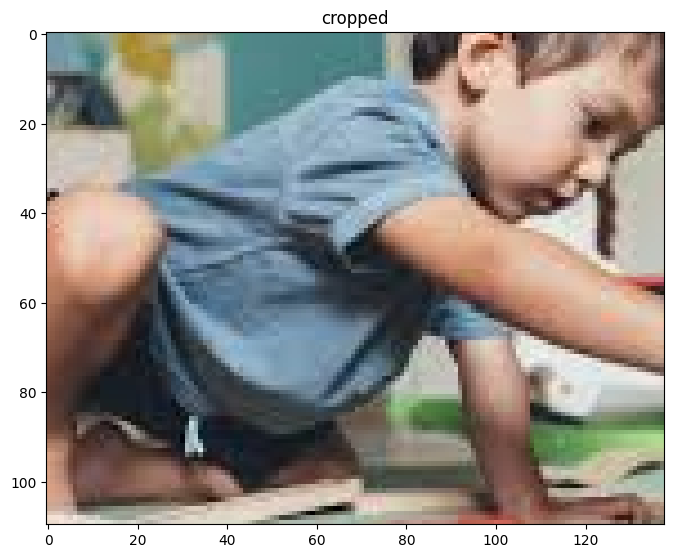

In [71]:
from inspect import EndOfBlock
#now we are going to see how to crop the image:

height, width = image.shape[:2]

start_row, start_col = int(height*.15),int(width*.25)
end_row, end_col = int(height*.75), int(width*.75)

cropped = image[start_row:end_row, start_col:end_col]
imshow("original",image)

copy = image.copy()
cv2.rectangle(copy, (start_col, start_row), (end_col, end_row), (0, 255, 0), 2)
imshow("rectangle", copy)


imshow("cropped", cropped)

**Arithmetic operation can be used to brighten or darken the image ..Bitwise can be used in case of selection the same as we do in venn diagrams**

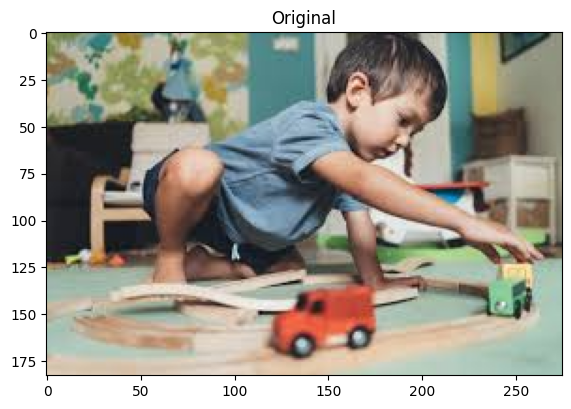

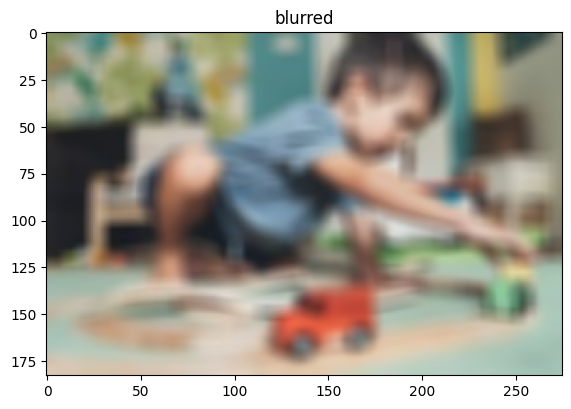

In [72]:
#blurring using convulutions

imshow("Original", image)
kernel_3x3 = np.ones((9,9), np.float32)/81 #if we increase the kernal size the intensity of blurness will be increased
blurred = cv2.filter2D(image, -1, kernel_3x3)
imshow("blurred", blurred)

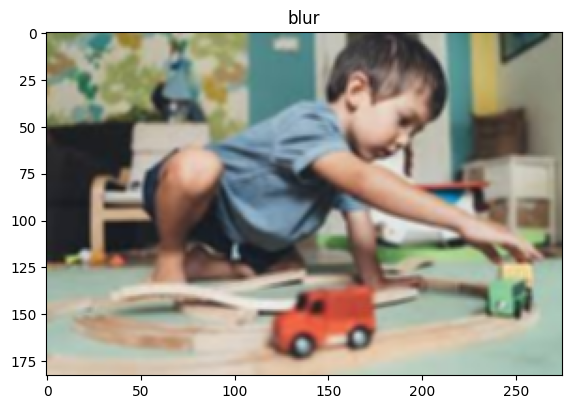

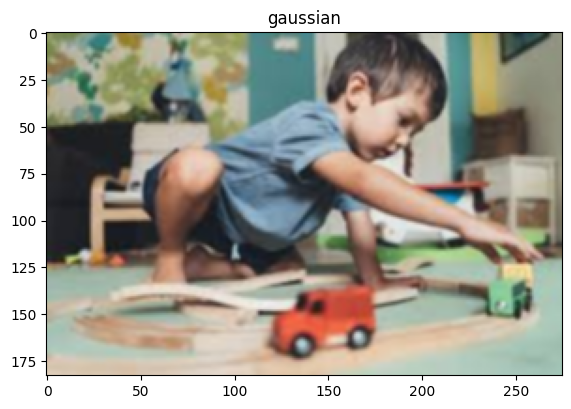

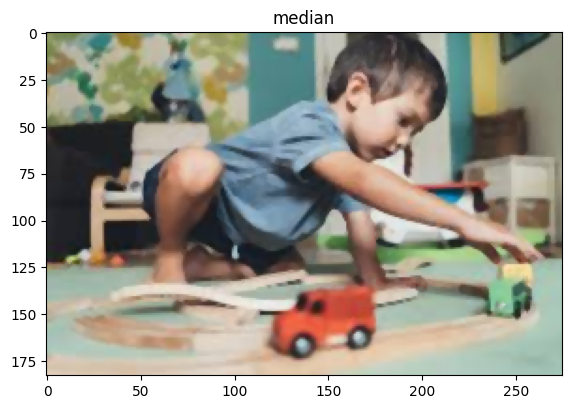

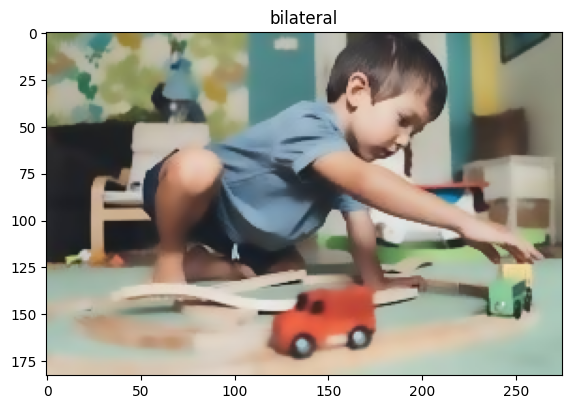

In [73]:
import cv2
import numpy as np

image = cv2.imread('/content/sample.jfif')

blur = cv2.blur(image, (3,3))
imshow("blur", blur)

gaussian = cv2.GaussianBlur(image, (3,3), 0)
imshow("gaussian", gaussian)

median = cv2.medianBlur(image, 3)
imshow("median", median)

bilateral = cv2.bilateralFilter(image, 9, 75, 75)
imshow("bilateral", bilateral)

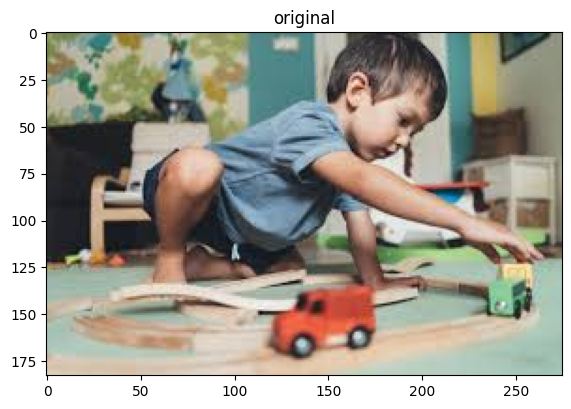

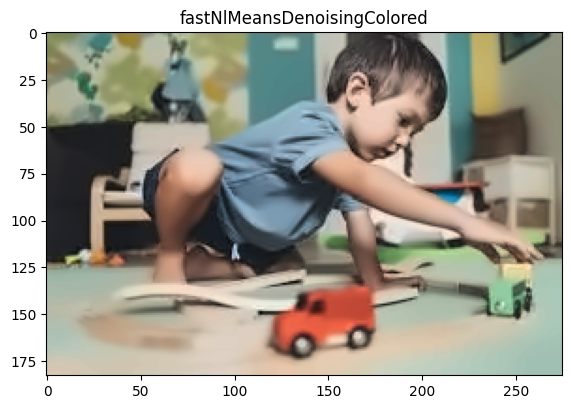

In [74]:
imshow("original", image)

dst = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)
imshow("fastNlMeansDenoisingColored", dst)

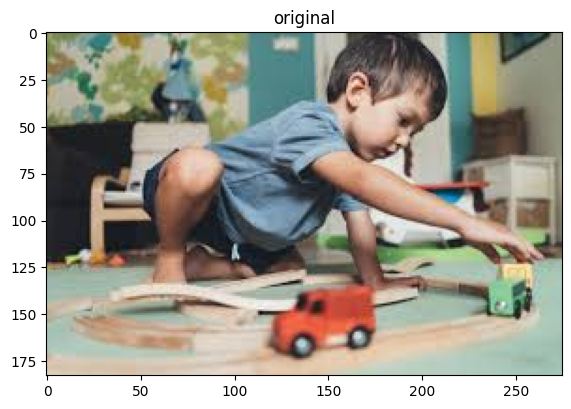

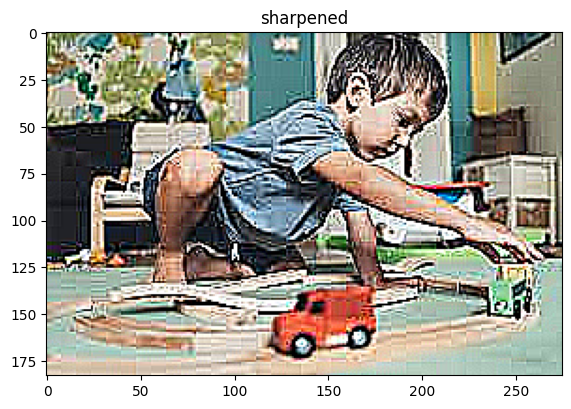

In [75]:
#sharpening of the image

imshow("original", image)
kernal_sharpening = np.array([[-1,-1,-1],
                             [-1,9,-1],
                             [-1,-1,-1]])

#applying sharpning kernal to the image
sharpened = cv2.filter2D(image, -1, kernal_sharpening)
imshow("sharpened", sharpened)

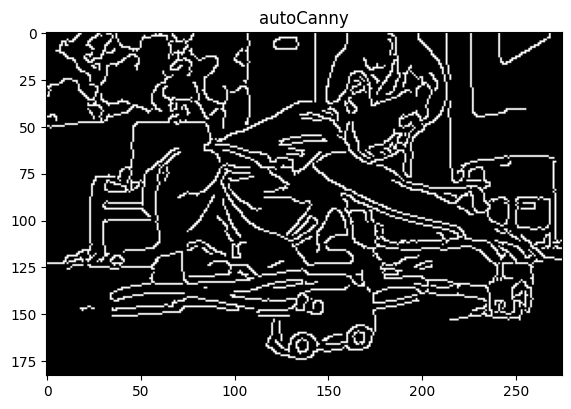

In [76]:
def autoCanny(image):
  blurred_img = cv2.blur(image, ksize=(3,3))
  med_val = np.median(image)
  lower = int(max(0, 0.7 * med_val))
  upper = int(min(225, 1.33 * med_val))
  canny_img = cv2.Canny(blurred_img, lower, upper)
  return canny_img

auto_canny = autoCanny(image)
imshow("autoCanny", auto_canny)

number of contours =  192


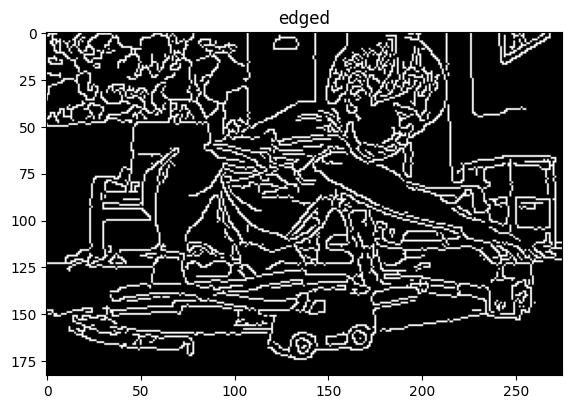

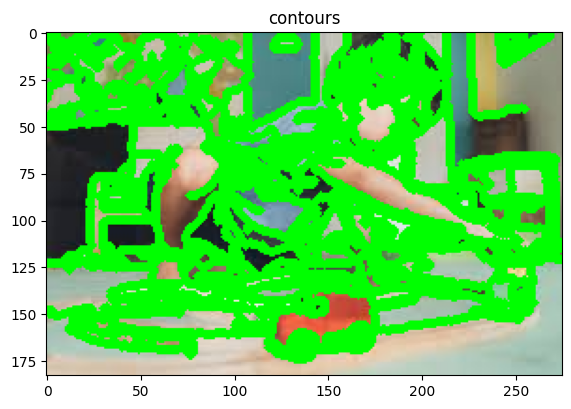

In [77]:
#now we are going to see about contours
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# _, th2 = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
# imshow("threshold", th2)

#giving threshold is important otherwise the number of contours will always be 1

edged = cv2.Canny(gray, 30, 200)
imshow("edged", edged)


contours, hierarchy = cv2.findContours(edged, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(image, contours, -1, (0, 255, 0), 3)
imshow("contours", image)

print("number of contours = ", len(contours))

In [78]:
#i skipped retreival modes you can do it if you want
